# Описание и краткие выводы

Работа состоит из 4 этапов: анализ метаданных, численный и визуальный анализы изображений, а также аугментация.

1. В ходе анализа метаданных мы рассмотрели различные распределения атрибутов. Основными выводами стали:
- Атрибуты sex и localization содержат большое количество пропусков
- Распределение возрастов схожее для всех болезней
- Основываясь на вышеуказанных выводах, мы решили не использовать метаданные при обучении модели

2. В рамках численного анализа мы рассмотрели различные распределения интенсивности пикселей по разным каналам изображения, построили распределение классов внутри датасета, а также попытались кластеризовать изображения и посмотреть отличаются ли классы друг от друга по распределению пикселей по HSV.В качестве основных выводов во второй части можно выделить:
- Наиболее насыщенными пикселями среди всех картинок являются красные
- Классы заболеваний отличаются между собой по распределению пикселей - это будет видно и дальше при визуальном анализе
- Также различие в цветах и насыщености по классам дает и анализ HSV распределений
- Однако кластеризация по 2 первым компонентам SVD разложения не дает положительного результата - все классы собраны в кучу
- Существует очевидный перевес класса nv над всеми остальными, что потенциально может стать проблемой в будущем

3. В рамках визуального анализа мы построили средние изображения разных заболеваний по трем каналам и получили следующие выводы:
- Среднее изображение без учета класса не дает хорошего представления о картинках
- Среднее изображение по каждому классу примерно дает понять специфику заболевания, выделяя различные цвета для разных классов

4. В качестве аугментаций мы решили рассмотреть 3 основных: размытие (blur), поворот картинки (на 90, 180 и 270 градусов), а также зеркальное отражение картинки. Все виды аугментации мы решили применить ко всем классам, кроме nv - т.к. последний и так очень перепредставлен в выборке.

# Импорты и загрузка данных

Импортируем все библиотеки, необходимые для дата процессинга

In [ ]:
#!pip install gdown

import gdown
import zipfile
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm
import cv2 as cv
import seaborn as sns
from itertools import chain
from sklearn.preprocessing import MinMaxScaler
from matplotlib import colors
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

Скачиваем датасет

In [ ]:
url = 'https://drive.google.com/uc?id=1NvrnEsP1sQDeFoV17VOFZQDlADMXMXdh'
output = 'HAM10000_images_part_1.zip'
gdown.download(url, output, quiet=False)

with zipfile.ZipFile('HAM10000_images_part_1.zip', 'r') as zip_ref:
    zip_ref.extractall("/images/")

url = 'https://drive.google.com/uc?id=1Vl-T_QZlCwIQRLU3KtfNOUYcW9P6Yk4r'
output = 'HAM10000_images_part_2.zip'
gdown.download(url, output, quiet=False)

with zipfile.ZipFile('HAM10000_images_part_2.zip', 'r') as zip_ref:
    zip_ref.extractall("/images/")

url = 'https://drive.google.com/uc?id=1BBdwl5StKpqLyUGVQ2mASONWW-XShEmF'
output = 'HAM10000_metadata.csv'
gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1NvrnEsP1sQDeFoV17VOFZQDlADMXMXdh
From (redirected): https://drive.google.com/uc?id=1NvrnEsP1sQDeFoV17VOFZQDlADMXMXdh&confirm=t&uuid=45664ce6-3bf9-45d6-a38a-50006c2f2ee4
To: /content/HAM10000_images_part_1.zip
100%|██████████| 1.37G/1.37G [00:23<00:00, 58.5MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1Vl-T_QZlCwIQRLU3KtfNOUYcW9P6Yk4r
From (redirected): https://drive.google.com/uc?id=1Vl-T_QZlCwIQRLU3KtfNOUYcW9P6Yk4r&confirm=t&uuid=7843a3e6-30dd-4d98-a8b0-b68858a9e5c8
To: /content/HAM10000_images_part_2.zip
100%|██████████| 1.40G/1.40G [00:14<00:00, 95.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1BBdwl5StKpqLyUGVQ2mASONWW-XShEmF
To: /content/HAM10000_metadata.csv
100%|██████████| 690k/690k [00:00<00:00, 95.3MB/s]


'HAM10000_metadata.csv'

In [ ]:
data = pd.read_csv('HAM10000_metadata.csv')

## Метаданные

Проведем анализ метаданных.

В метаданных, которые могли бы помочь в решении задачи классификации, присутствует следующий набор переменных: lesion_id, image_id, dx ,dx_type, age, sex, localization, dataset. На официальном [сайте](https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/DBW86T&version=4.0) с датасетом HAM10000, который мы использовали в работе, указано, что данные были собраны из различных популяций и из различных модальностей. Также приведена статья авторов датасета, в которой подробно описан сбор данных.

In [ ]:
data.head(10)

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern
5,HAM_0001466,ISIC_0027850,bkl,histo,75.0,male,ear,vidir_modern
6,HAM_0002761,ISIC_0029176,bkl,histo,60.0,male,face,vidir_modern
7,HAM_0002761,ISIC_0029068,bkl,histo,60.0,male,face,vidir_modern
8,HAM_0005132,ISIC_0025837,bkl,histo,70.0,female,back,vidir_modern
9,HAM_0005132,ISIC_0025209,bkl,histo,70.0,female,back,vidir_modern


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
 7   dataset       10015 non-null  object 
dtypes: float64(1), object(7)
memory usage: 626.1+ KB


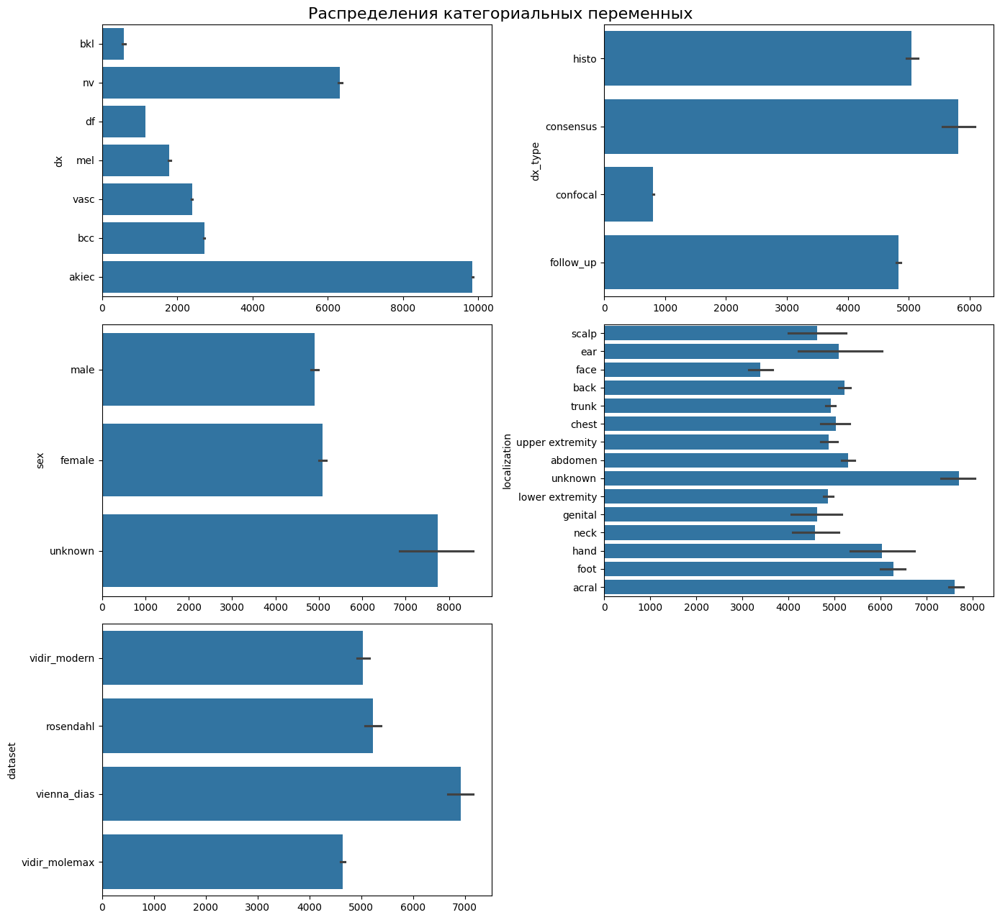

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(14, 13))
axes = axes.flatten()
for i in range(5):
  sns.barplot(data[['dx', 'dx_type', 'sex', 'localization', 'dataset']].iloc[:, i], ax=axes[i])

fig.suptitle('Распределения категориальных переменных', fontsize=16)
fig.delaxes(axes[5])
plt.tight_layout()

В датасете довольно много наблюдений с пропусками в столбцах sex и localization. В остальных столбцах категории распределены относительно равномерно.

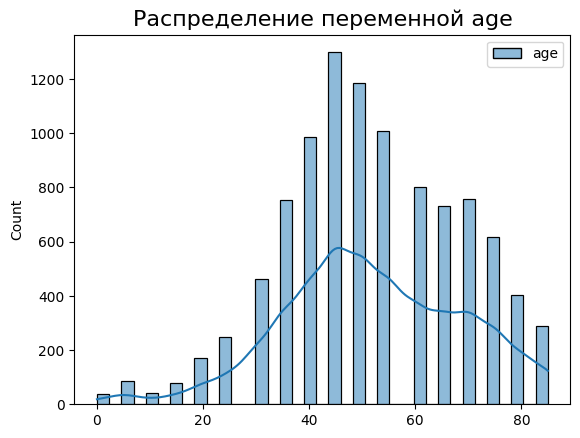

In [ ]:
plt.title('Распределение переменной age', fontsize=16)
sns.histplot(data[['age']], kde=True);

In [ ]:
data.describe()

,age
count,9958.000000
mean,51.863828
std,16.968614
min,0.000000
25%,40.000000
50%,50.000000
75%,65.000000
max,85.000000


Распределение переменной age смещено вправо, у нас мало наблюдений для детей, большинство наблюдений приходится на диапазон 40-70 лет

Давайте теперь рассмотрим распределения возрастов по болезням

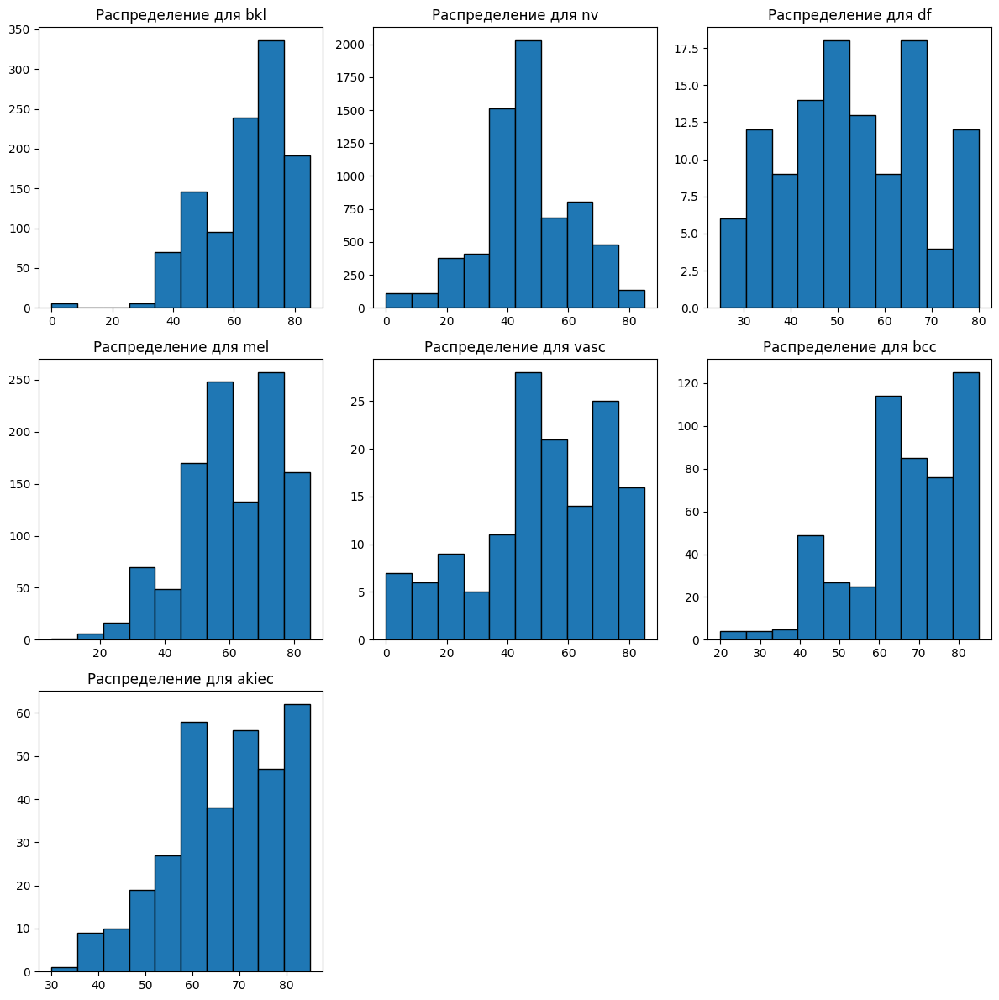

In [ ]:
sick = data['dx'].unique()
fig, ax = plt.subplots(sick.shape[0]//3+1, 3, figsize=(12, 12))
row, col = 0, 0
for i in sick:
  ax[row, col].hist(data[data['dx']==i]['age'], edgecolor = 'black')
  ax[row, col].set_title(f"Распределение для {i}")
  if col < 2:
    col += 1
  else:
    row += 1
    col = 0

fig.delaxes(ax[2, 1])
fig.delaxes(ax[2, 2])
plt.tight_layout()


Из графиков видно, что, за исключением 'nv', все болезни чаще встречаются у старших поколений (50-80 лет)

\

# Блок функций для дальнейшей обработки

In [ ]:
### Функция для сбора картинок в np.array
def get_images_array(first_image=0, num_images=100):
  """A function for recieving an array of images as np arrays"""
  images = []
  for image in tqdm(os.listdir("/images/")[first_image:first_image + num_images]):
    images.append(np.asarray(Image.open("/images/"+image)))
  return np.array(images)

### Функция фильтрации цветовых каналов в картинке
def get_image_channels(image, channels: list):
  """Function for filterring image color channels"""
  im_copy = image.copy()
  colors = {'r':0, 'g':1, 'b':2}
  for i in range(3):
    if i not in [colors[key] for key in channels]:
      im_copy[:, :, i] = 0
  return im_copy

In [ ]:
# функция для рандомного выбора n картинок каждого класса
def get_N_random_grouped_images(num_images=1000):
  """Randomize images order and get them grouped"""
  grouping = {
      'bkl':[],
      'nv':[],
      'df':[],
      'mel':[],
      'vasc':[],
      'bcc':[],
      'akiec':[]
  }

  data_shuffled = data.sample(n = num_images) # Перемешиваем данные и берём N строк

  for id, row in data_shuffled.iterrows():
    grouping.get(row['dx']).append(row['image_id'])

  del data_shuffled

  grouped_images = {
      'bkl':[],
      'nv':[],
      'df':[],
      'mel':[],
      'vasc':[],
      'bcc':[],
      'akiec':[]
  }
  for key in grouping:
    for image in tqdm(grouping[key]):
      grouped_images.get(key).append(np.asarray(Image.open("/images/"+image+".jpg"))) # Достаём фото по image_id

  for key in grouped_images:
    grouped_images[key] = np.asarray(grouped_images[key])

  del grouping

  return grouped_images

Посколько картинки весят достаточно много, напишем функцию, которая позволит нам доставать картинки определенного класса, чтобы сделать аугментации и у нас не упала опертивная память

In [ ]:
# функция для выбора картинок определенного класса

def get_all_grouped_images(data: pd.DataFrame, name: str, num_images: int =-1):
  """Takes particular amount of images with a spesific class"""
  group = data[data['dx']==name]['image_id'].to_list()[:num_images] # берем image_id всех картинок этого класса
  grouped_images = []

  for i in range(len(group)):
    grouped_images.append(np.asarray(Image.open("/images/"+group[i]+".jpg"))) # загружаем фотки по image_id
    group[i] += '_' + name

  return group, crop(grouped_images) # сразу обрезаем до квадратных

Добавляем функцию поворота изображений, чтобы циклом собрать все аугментации через заданный параметр

In [ ]:
# функция для поворота изображений
def rotate_image(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2) # находим центр картинки
  rot_mat = cv.getRotationMatrix2D(image_center, angle, 1.0) # вычисляем матрицу поворота
  result = cv.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv.INTER_LINEAR) # делаем поворот картинки
  return result

Дальше будем обрезать картинки до квадратных, чтобы при повороте их размер не изменялся

In [ ]:
# функция для обрезки изображения
def crop(grouped_images: list) -> list:
  """Cuts the image to square form"""
  output_images = []
  for i in range(len(grouped_images)):
    output_images.append(grouped_images[i][:, 75:525,:])

  return output_images

функция для CLAHE

In [ ]:
# функция для применения CLAHE
def clahe(img, is_gray=False, clipLimit=2.0, tileGridSize=(8,8)):
  '''Applyes CLAHE to image '''
  if is_gray==False:
    img_copy = img.copy()
    del img
    # create a CLAHE object
    clahe = cv.createCLAHE(clipLimit, tileGridSize)
    for i in range(3):
      img_copy[:, :, i] = clahe.apply(img_copy[:, :, i])
    return img_copy
  else:
    img_copy = img.copy()
    del img
    # create a CLAHE object
    clahe = cv.createCLAHE(clipLimit, tileGridSize)
    img_copy[:, :] = clahe.apply(img_copy)
    return img_copy

Напишем функцию, которая скопом будет делать все аугментации, чтобы в дальнейшем удобно было ее использовать для обучения

In [ ]:
def augmentation(names: list[str], images: list[list], flip_img: bool =False, blur_img: bool=False, angles_for_rotate: list[int] =[]) -> (list[str], list[list]):
  """Function for all augmentations:
  - flip
  - blur
  - rotations for 90, 180 and 270 degrees
  """
  augmented_names = []
  augmented_images = []

# если нужно, то делаем разворот картинки по горизонтали
  if flip_img:
    flipped_names = []
    flipped_images = []
    for i in range(len(names)):
        flipped_names.append(names[i]+'_flip')
        flipped_images.append(cv.flip(images[i], 1))
    augmented_names.append(flipped_names)
    augmented_images.append(flipped_images)

# если нужно, то делаем размытие картинки со случайным квадратным ядром от 3х3 до 9х9
  if blur_img:
    blurred_names = []
    blurred_images = []
    for i in range(len(names)):
        blurred_names.append(names[i]+'_blur')
        blurred_images.append(cv.GaussianBlur(src=images[i], ksize = (2*random.randint(1, 4) + 1, 2*random.randint(1, 4) + 1), sigmaX = 0))
    augmented_names.append(blurred_names)
    augmented_images.append(blurred_images)

# если передали хотя бы один угол, то делаем поворот на это угол против часовой стрелки
  if angles_for_rotate:
    for angle in angles_for_rotate:
      rotated_names = []
      rotated_images = []
      for i in range(len(names)):
        rotated_names.append(names[i]+'_ro'+str(angle))
        rotated_images.append(rotate_image(images[i], angle))
      augmented_names.append(rotated_names)
      augmented_images.append(rotated_images)

  return augmented_names, augmented_images

# Численный анализ

Здесь будем рассматривать распределение классов, интенсивность цветов, кластеризацию изображений и другие численные методы предварительной обработки изображений

### Распределение классов

Сначала смотрим на общие параметры вне контекста класса. Для этого возьмем случайный семпл картинок

In [ ]:
# Сохраняем 100 картинок в массив
images = get_images_array(num_images=500)
print(f"Размерность images: {images.shape}")

# Создаем массив с ЧБ картинками
gray_images = np.array([cv.cvtColor(x, cv.COLOR_RGB2GRAY) for x in images])
print(f"Размерность images: {gray_images.shape}")

100%|██████████| 500/500 [00:07<00:00, 71.22it/s] 


Размерность images: (500, 450, 600, 3)
Размерность images: (500, 450, 600)


В первую очередь рассмотрим распределение картинок по классам, чтобы оценить, есть ли перекос в пользу некоторызх классов

<Axes: xlabel='dx', ylabel='Count'>

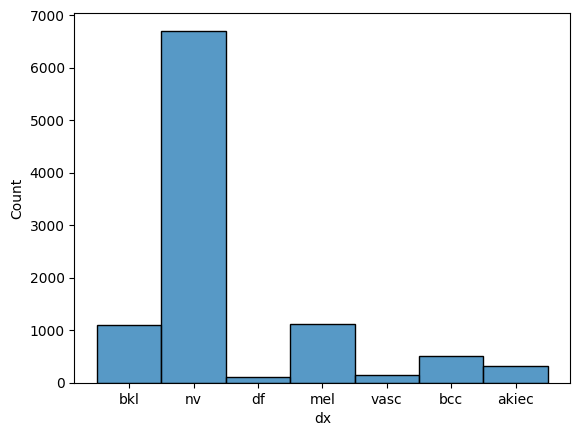

In [ ]:
sns.histplot(x='dx', data=data)

Видим, что некоторые болезни представлены в кратное число раз больше чем другие. Давайте учтём это при анализе средней картины и посмотрим на среднюю картину одинакового количества фото каждой группы

### Распределение интенсивности пикселей

Рассмотри распределение ЧБ пикселей, для оценки того, насколько интенсивное изображенние в среднем, в дальнейшем это нам пригодится, когда мы будем нормализовать картинку для обучения

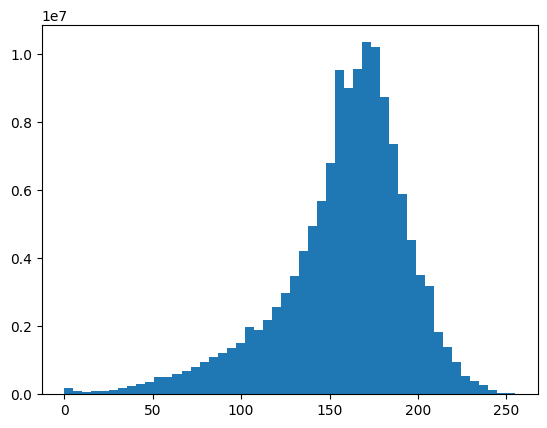

In [ ]:
# Распределение интенсивности ЧБ пикселей
plt.hist(gray_images.flatten(), bins=50);

Теперь посмотрим на то же самое, но для каждого канала и для разных классов

100%|██████████| 7/7 [00:14<00:00,  2.00s/it]


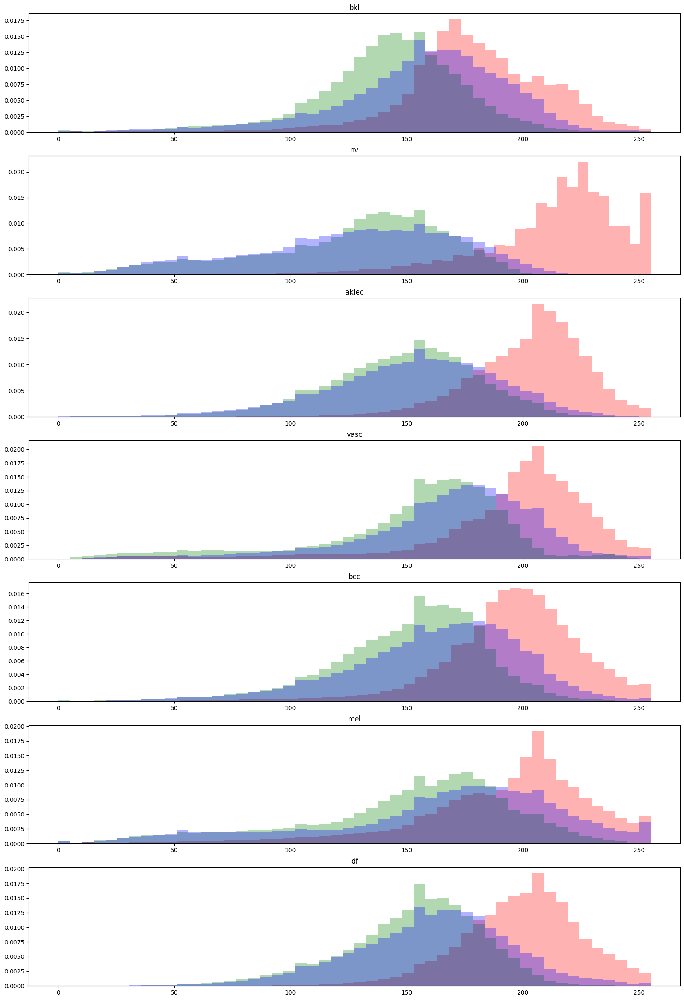

In [ ]:
# Распределение интенсивности пикселей по цветам
fig, ax = plt.subplots(7, 1, figsize = (20, 30))
names = list(set(data['dx']))
for i in tqdm(range(len(names))):
  nms, images = get_all_grouped_images(data, names[i], 100)
  ax[i].hist(np.array(images)[:, :, :, 0].flatten(), bins=50, alpha=0.3, density=True, color='r');
  ax[i].hist(np.array(images)[:, :, :, 1].flatten(), bins=50, alpha=0.3, density=True, color='g');
  ax[i].hist(np.array(images)[:, :, :, 2].flatten(), bins=50, alpha=0.3, density=True, color='b');
  ax[i].set_title(names[i])
plt.show()

Видим, что интенсивность красных пикселей в среднем выше - что достаточно логично, потому что большинство родинок, да и кожа в целом ближе к красному оттенку

Кроме того, хорошо видна разница и между классами: например, bkl имеет примерное одинаковое распределение интенсивности по всем каналам, что говорит о том, что среднее такое изображение будет скорее близкий к черному или коричневому цвету. В то время как vasc, akeic и mel чаще будут иметь больший уклон в сторону красного цвета

### Сравнение по HSV

Теперь сравним классы между собой по HSV распределению

In [ ]:
# Выберем 1000 картинок и сгруппируем по классам
grouped_images = get_N_random_grouped_images(num_images=1000)

100%|██████████| 30/30 [00:00<00:00, 84.34it/s]


15


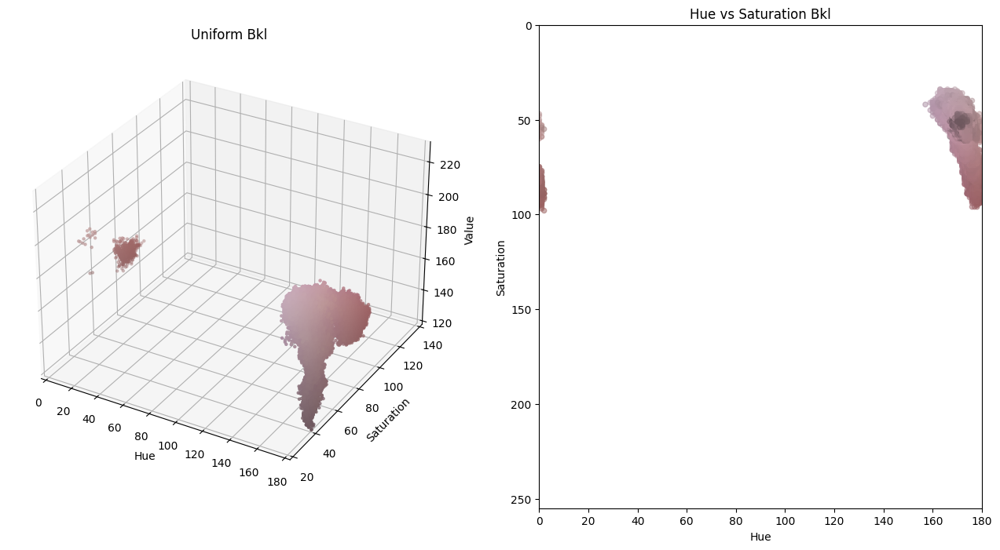

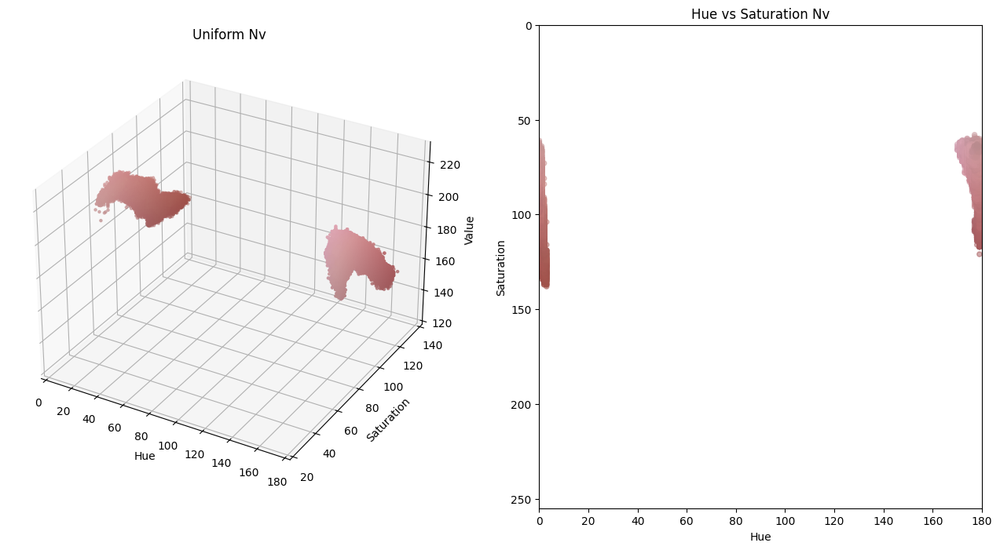

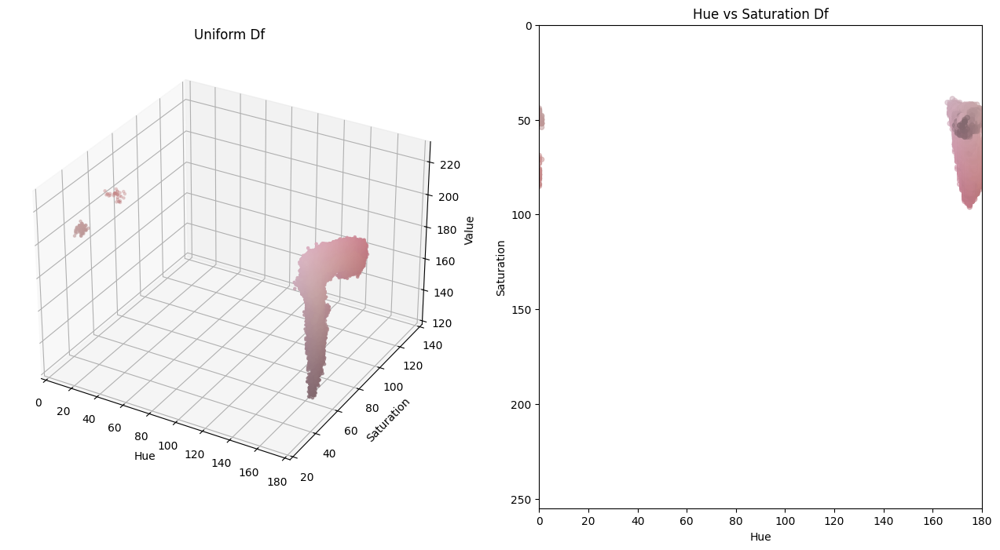

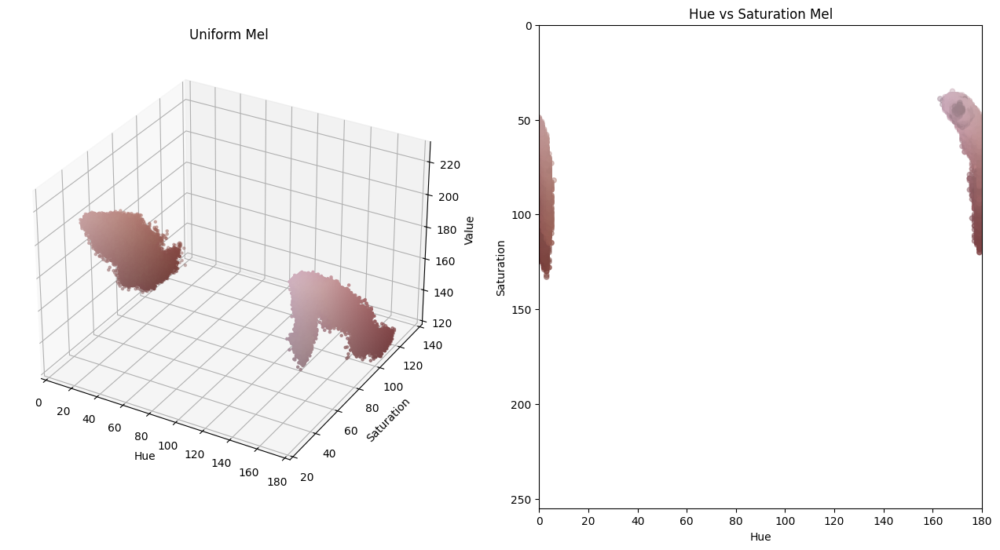

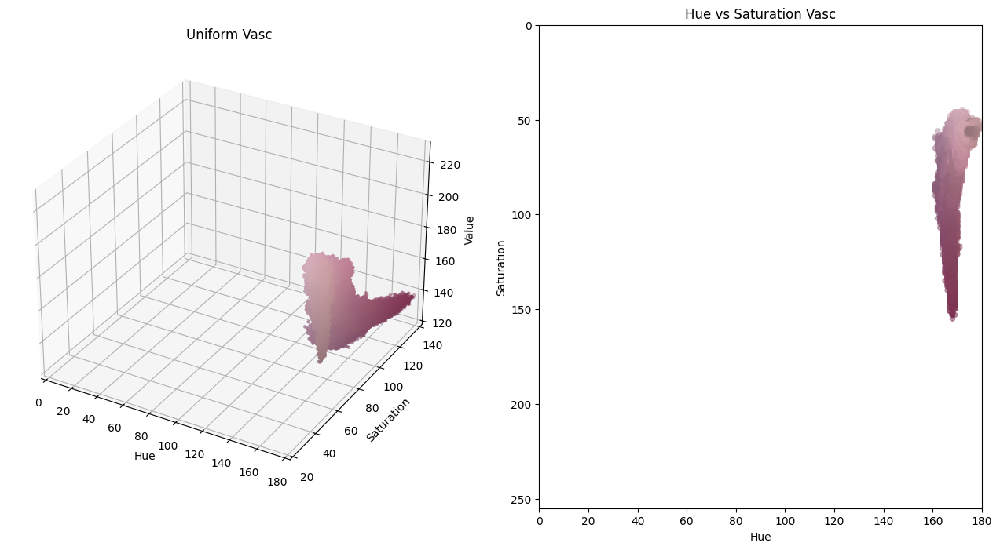

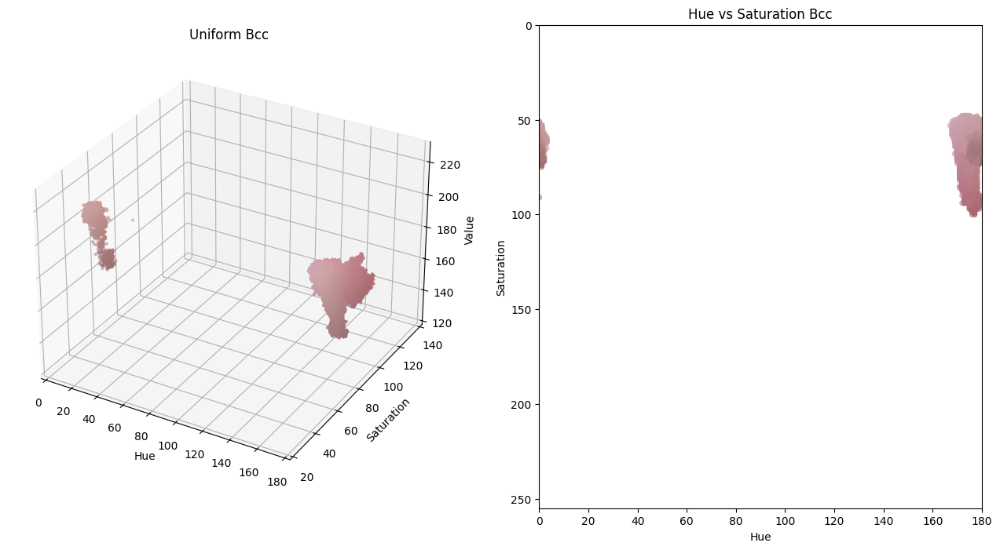

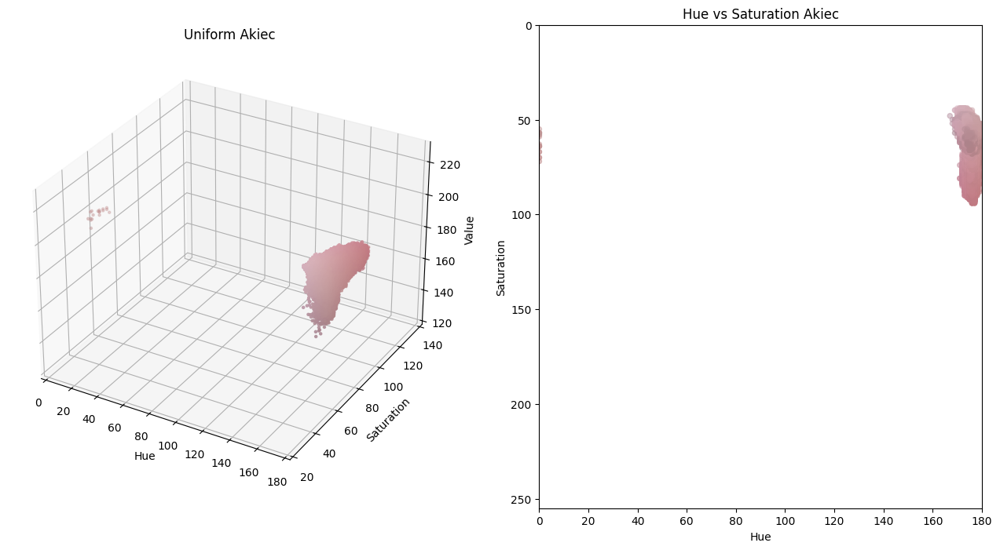

In [ ]:
lowest_len = np.inf
for key in grouped_images:
  lowest_len = min(lowest_len, len(grouped_images[key])) # Ищем минимальное общее число для всех групп
print(lowest_len)

for i, key in enumerate(grouped_images):
  images_group = grouped_images[key][:lowest_len]

  img = images_group.mean(axis=0).astype(np.uint8)

  # convert image to HSV color space
  hsv_img = cv.cvtColor(img, cv.COLOR_RGB2HSV)

  # split the HSV channels
  h, s, v = cv.split(hsv_img)

  # create the 3D scatter plot
  fig = plt.figure(figsize=(16, 8))
  ax1 = fig.add_subplot(1, 2, 1, projection="3d")
  ax2 = fig.add_subplot(1, 2, 2)

  pixel_colors = img.reshape((img.shape[0] * img.shape[1], 3)) / 255.0  # Normalize for plotting

  # plot the image pixels in 3D
  ax1.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".", s=20)
  ax1.set_xlabel("Hue")
  ax1.set_ylabel("Saturation")
  ax1.set_zlabel("Value")
  ax1.set_xlim(0, 180)
  ax1.set_ylim(20, 140)
  ax1.set_zlim(120, 230)
  ax1.set_title("Uniform " + key.capitalize())

  # plot the hue and saturation components
  ax2.scatter(h.flatten(), s.flatten(), s=20, c=pixel_colors, alpha=0.5)
  ax2.set_xlabel("Hue")
  ax2.set_ylabel("Saturation")
  ax2.set_xlim(0, 180)
  ax2.set_ylim(0, 255)
  ax2.set_title("Hue vs Saturation " + key.capitalize())
  ax2.invert_yaxis()

  # save the plot as PNG image
  plt.savefig("scatterplot.png", dpi=300)

  # show the plot
  plt.show()

Видим, что разные классы изображений имеют разные распределение насыщенности, цвета и яркости. Так например, для bcc мы видми, что пиксели распределены достаточно равномерно, что говорит о том, что среди разных элементов картинки нет сильного цветого различия. Что нельзя например сказать об остальный заболеваниях

### Кластеризация

Теперь попытаемся кластеризовать изображения по 2 компонентам SVD разложения, посмотрим есть ли какая то закономерность

In [ ]:
#берем по 100 картинок каждого класса, а то в память больше не влезает
names = []
image_list = []

for i in tqdm(list(set(data['dx']))):

  print(i)
  nm, ims = get_all_grouped_images(data, i, 100)
  names += nm
  image_list += ims

  0%|          | 0/7 [00:00<?, ?it/s]

bkl


 14%|█▍        | 1/7 [00:00<00:04,  1.37it/s]

nv


 29%|██▊       | 2/7 [00:01<00:04,  1.24it/s]

akiec


 43%|████▎     | 3/7 [00:02<00:02,  1.34it/s]

vasc


 57%|█████▋    | 4/7 [00:03<00:02,  1.33it/s]

bcc


 71%|███████▏  | 5/7 [00:03<00:01,  1.32it/s]

mel


 86%|████████▌ | 6/7 [00:04<00:00,  1.30it/s]

df


100%|██████████| 7/7 [00:05<00:00,  1.31it/s]


По отдельности рассмотрим кластеризацию по каждому цвету

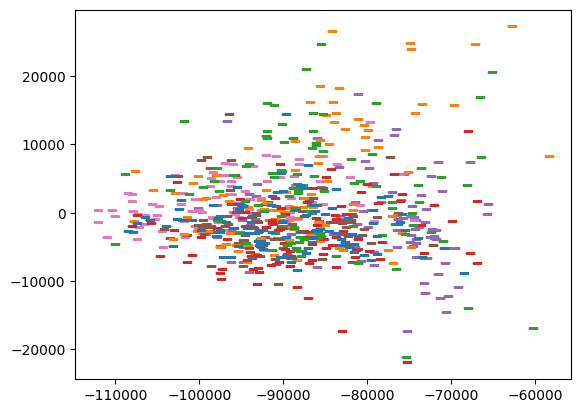

In [ ]:
# берем красный цвет
fin_arr = np.array(image_list)[:,:,:, 0].reshape(700, -1)

import numpy as np
from numpy.linalg import svd
U, S, VT = svd(fin_arr, full_matrices=False)
pr = (U @ np.diag(S))[:, 0:2]

nm = list(set([i.split('_')[-1] for i in names]))
colors = {'df' : 'tab:blue', 'vasc' : 'tab:orange', 'mel' : 'tab:green', 'bcc' : 'tab:red', 'bkl' : 'tab:purple', 'akiec' : 'tab:brown', 'nv' : 'tab:pink'}
for i in range(len(names)):
  plt.scatter(pr[: , 0][i], pr[:, 1][i], marker=r'$' + str(names[i]) + '$', color=colors[names[i].split('_')[-1]])

plt.show()

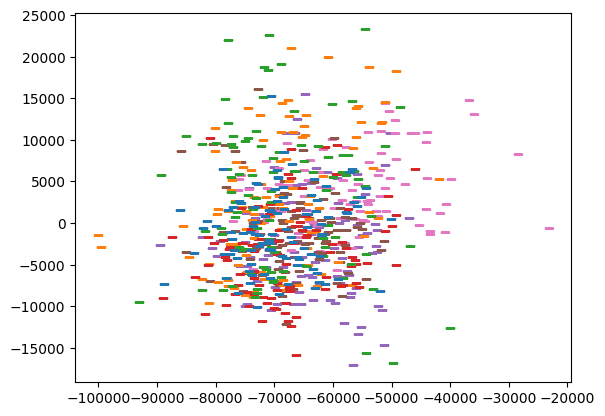

In [ ]:
# берем зеленый цвет
fin_arr = np.array(image_list)[:,:,:, 1].reshape(700, -1)
U, S, VT = svd(fin_arr, full_matrices=False)
pr = (U @ np.diag(S))[:, 0:2]

nm = list(set([i.split('_')[-1] for i in names]))
colors = {'df' : 'tab:blue', 'vasc' : 'tab:orange', 'mel' : 'tab:green', 'bcc' : 'tab:red', 'bkl' : 'tab:purple', 'akiec' : 'tab:brown', 'nv' : 'tab:pink'}
for i in range(len(names)):
  plt.scatter(pr[: , 0][i], pr[:, 1][i], marker=r'$' + str(names[i]) + '$', color=colors[names[i].split('_')[-1]])
plt.show()

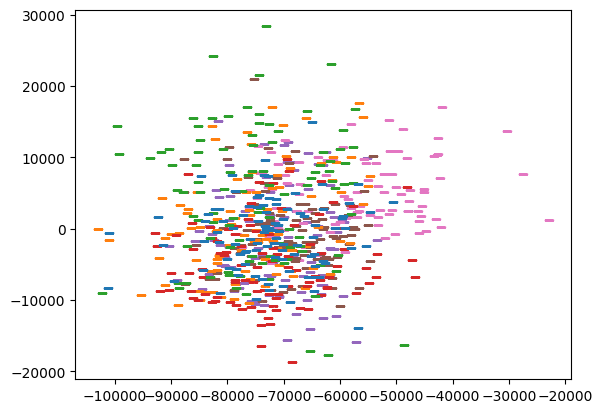

In [ ]:
# берем синий цвет
fin_arr = np.array(image_list)[:,:,:, 2].reshape(700, -1)

U, S, VT = svd(fin_arr, full_matrices=False)
pr = (U @ np.diag(S))[:, 0:2]

nm = list(set([i.split('_')[-1] for i in names]))
colors = {'df' : 'tab:blue', 'vasc' : 'tab:orange', 'mel' : 'tab:green', 'bcc' : 'tab:red', 'bkl' : 'tab:purple', 'akiec' : 'tab:brown', 'nv' : 'tab:pink'}
for i in range(len(names)):
  plt.scatter(pr[: , 0][i], pr[:, 1][i], marker=r'$' + str(names[i]) + '$', color=colors[names[i].split('_')[-1]])
plt.show()

Какой то закономерности выделить нельзя, поэтому несмотря на проведенный эксперимент, сделать суждение о данных, к сожалению по нему нельзя. Вероятно так получается из-за того, что двух компонент не достаточно, чтобы показать сложную зависимость данных в датасете

# Визуальный анализ

### Визуализация средних без группировки

Теперь будем смотреть на конкретные картинки и их производные, чтобы с другой стороны посмотреть на датасет

Для начала посмотрим просто на среднее изображение

100%|██████████| 500/500 [00:06<00:00, 74.93it/s] 


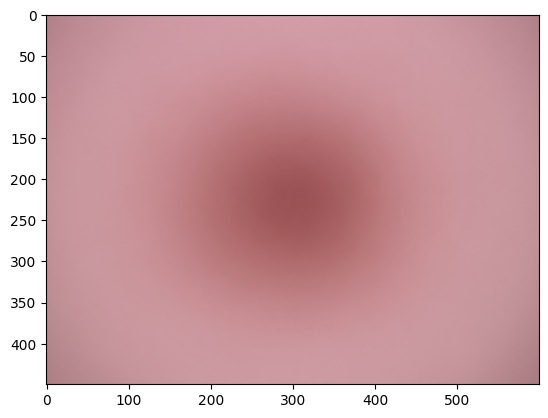

In [ ]:
images = get_images_array(num_images=500)

### Выводим среднее изображение
plt.imshow(images.mean(axis=0).astype(np.uint8))

Видими ожидаемое - цветное размытое пятно в виде родинки в центре картинки

Теперь взглянем на среднее ЧБ изображение

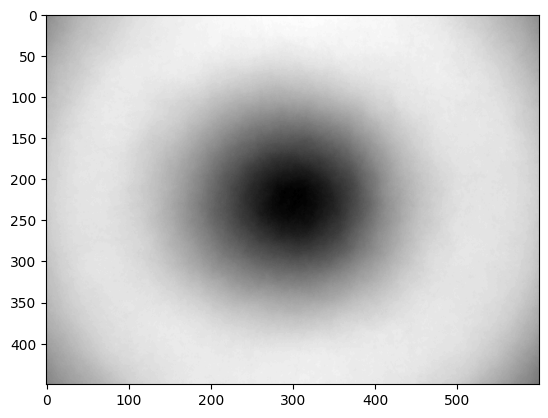

In [ ]:
### Выводим среднее ЧБ изображение
plt.imshow(gray_images.mean(axis=0).astype(np.uint8), cmap='gray')

Здесь мы видим аналогичную картинку, что и для цветного случая

Теперь сделаем аналогичную процедуру для каждого канала по выбранным изображениям

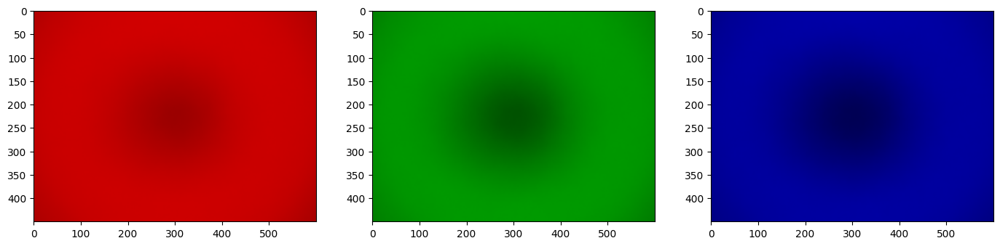

In [ ]:
### Среднее изображение по каналам
fig, axes = plt.subplots(1, 3, figsize=(17, 17))
axes[0].imshow(get_image_channels(images.mean(axis=0).astype(np.uint8), channels=['r']))
axes[1].imshow(get_image_channels(images.mean(axis=0).astype(np.uint8), channels=['g']))
axes[2].imshow(get_image_channels(images.mean(axis=0).astype(np.uint8), channels=['b']))

Здесь также можно сделать аналогичный вывод - по всем каналам видим нечто похожее на рамазанное пятно в центре изображения

### Группировка по классам

Теперь рассмотрим каждый класс картинок отдельно

In [ ]:
grouped_images = get_N_random_grouped_images(num_images=1000)

100%|██████████| 35/35 [00:00<00:00, 72.38it/s]


Посмотрим на 4 примера из каждой таргет категории (слабонервным не смотреть):

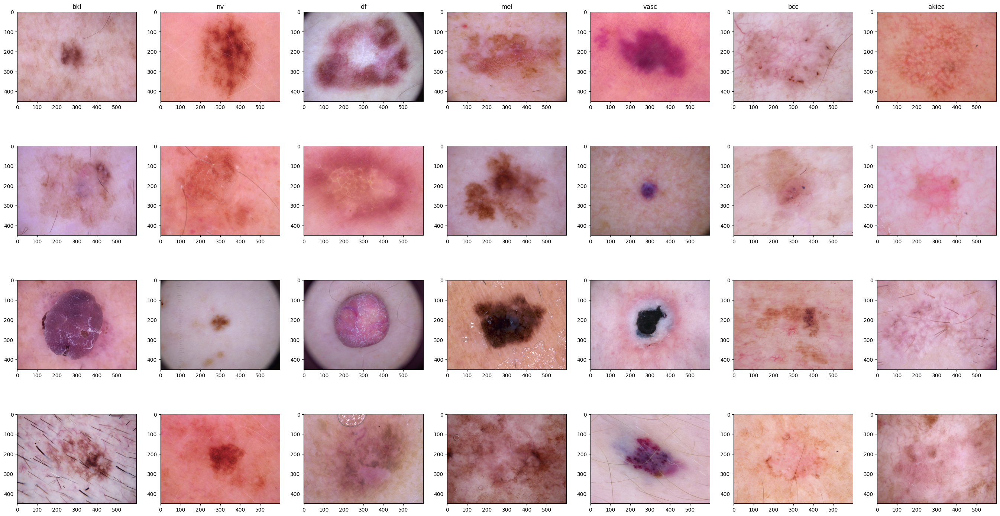

In [ ]:
fig, axes = plt.subplots(4, 7, figsize=(34, 18))
for i_row in range(4):
  for i_column, key in enumerate(grouped_images):
    images_group = grouped_images[key]
    axes[i_row, i_column].imshow(images_group[i_row].astype(np.uint8))
for ax, col in zip(axes[0], grouped_images.keys()):
    ax.set_title(col)
del images_group

Посмотрим на среднюю ЧБ картинку с группировкой по таргет классу:

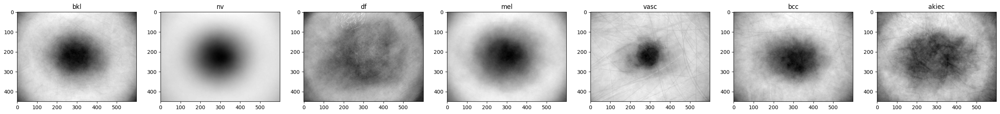

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(34, 34))
for i, key in enumerate(grouped_images):
  images_group = grouped_images[key]
  gray_images_group = np.array([cv.cvtColor(x, cv.COLOR_BGR2GRAY) for x in images_group])
  axes[i].imshow(gray_images_group.mean(axis=0).astype(np.uint8), cmap='gray')
  axes[i].title.set_text(f"{key}")
del images_group

Несмотря на похожие картинки, что и для общего множества изображений, здесь уже видна некоторая закономерность - например vasc и akeic более рамазаны и менее насыщены относительно других изображений

Посмотрим на среднюю RGB картинку с группировкой по таргет классу:

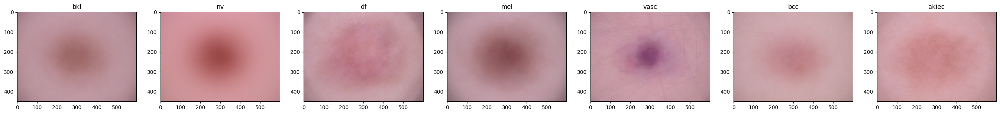

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(34, 34))
for i, key in enumerate(grouped_images):
  images_group = grouped_images[key]
  axes[i].imshow(images_group.mean(axis=0).astype(np.uint8))
  axes[i].title.set_text(f"{key}")
del images_group

Разница между классами становится более очевидной, когда мы принимаем цвета во внимание. Тогда vasc становится более узнаваемым на фоне остальных из-за ярко выраженного фиолетового цвета. Mel наприме более коричневая чем все остальные, а df, bcc и akeiс практически не отличаются по цвету от кожи вокруг

Попробуем посмотреть на среднюю картинку с примененным CLAHE

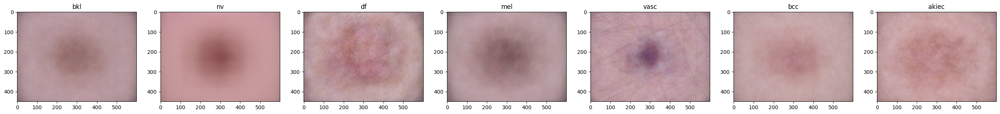

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(34, 34))
for i, key in enumerate(grouped_images):
  images_group = grouped_images[key]
  for j in range(len(images_group)):
    images_group[j] = clahe(images_group[j])
  axes[i].imshow(images_group.mean(axis=0).astype(np.uint8))
  axes[i].title.set_text(f"{key}")
del images_group

Применение CLAHE не повлияло на интерпретируемость средних картинок

Посмотрим на среднюю R, G и B картинки по отдельности с разбиением по таргет классу:

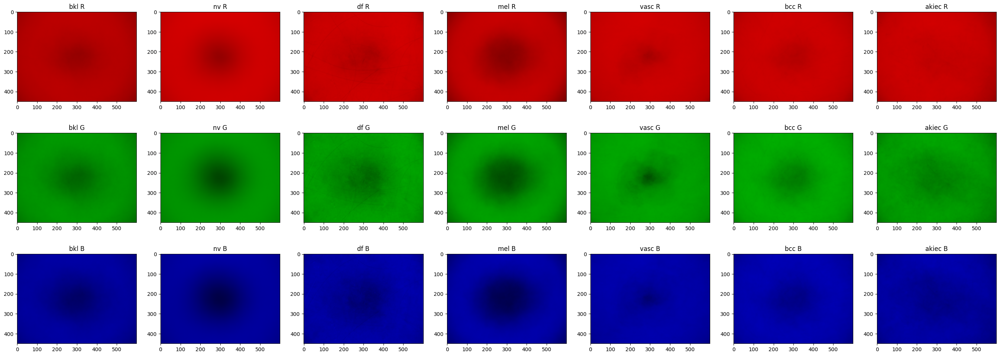

In [ ]:
fig, axes = plt.subplots(3, 7, figsize=(34, 12))
for i_row, color in enumerate(['r', 'g', 'b']):
  for i_column, key in enumerate(grouped_images):
    images_group = grouped_images[key]
    axes[i_row, i_column].imshow(get_image_channels(images_group.mean(axis=0).astype(np.uint8), channels=[color]))
    axes[i_row, i_column].title.set_text(f"{key} {color.upper()}")
del images_group

Теперь из каждого класса возьмём одинаковое количество случано выбранных картинок, чтобы средние картинки в среднем имели одинаковую дисперсию цветов в пикселях:

In [ ]:
lowest_len = np.inf
for key in grouped_images:
  lowest_len = min(lowest_len, len(grouped_images[key])) # Ищем минимальное общее число для всех групп
print(lowest_len)

11


Посмотрим теперь на средние картинки, где в каждой группе одинаковое количество фото:

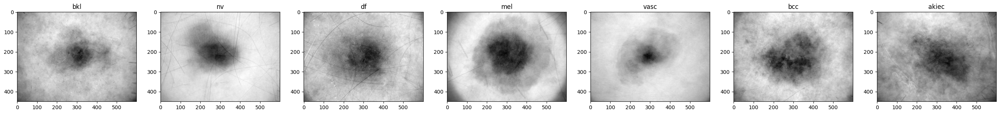

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(34, 34))
for i, key in enumerate(grouped_images):
  images_group = grouped_images[key][:lowest_len]
  gray_images_group = np.array([cv.cvtColor(x, cv.COLOR_BGR2GRAY) for x in images_group])
  axes[i].imshow(gray_images_group.mean(axis=0).astype(np.uint8), cmap='gray')
  axes[i].title.set_text(f"{key}")
del images_group

Уже здесь можно заметить более интересные закономерности. Например, nv, mel и vasc очень хорошо сосредоточены и имеют очень сконцентрированный и плотный вид, а остальные виды болезней достаточно разреженные.

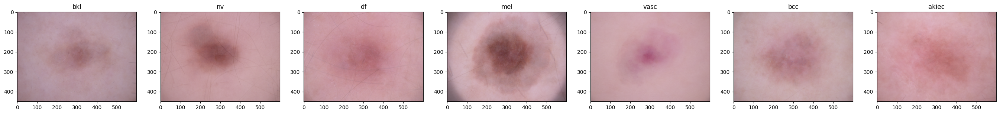

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(34, 34))
for i, key in enumerate(grouped_images):
  images_group = grouped_images[key][:lowest_len]
  axes[i].imshow(images_group.mean(axis=0).astype(np.uint8))
  axes[i].title.set_text(f"{key}")
del images_group

По цветной картинке можем увидеть другие особенности: vasc имеет отличительный синеватый оттенок, nv и mel ярко красный оттенок, а df белизну в центре.

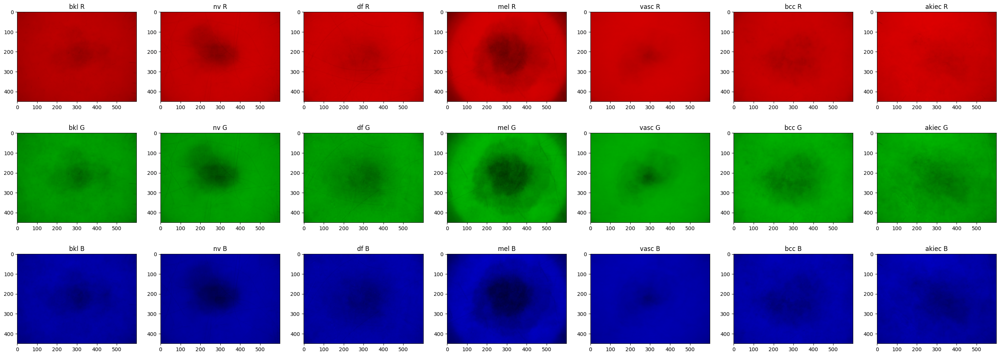

In [ ]:
fig, axes = plt.subplots(3, 7, figsize=(34, 12))
for i_row, color in enumerate(['r', 'g', 'b']):
  for i_column, key in enumerate(grouped_images):
    images_group_short = grouped_images[key][:lowest_len]
    axes[i_row, i_column].imshow(get_image_channels(images_group_short.mean(axis=0).astype(np.uint8), channels=[color]))
    axes[i_row, i_column].title.set_text(f"{key} {color.upper()}")
del images_group_short

Пропробуем применить CLAHE к изображениям

### Попытка сегментации

Попробуем просегментировать изображения алгоритмом из коробки, чтобы в дальнейшим более четко определять саму родинку

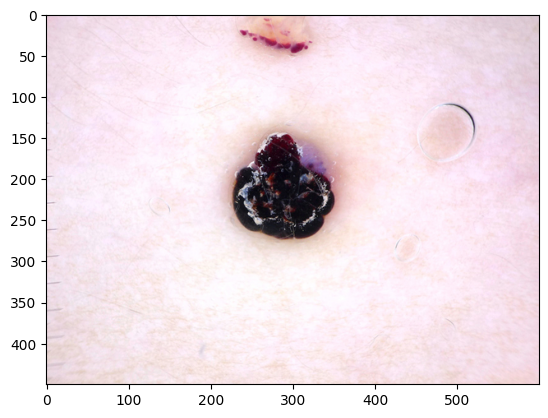

In [ ]:
import cv2
import matplotlib.pyplot as plt

images = ['ISIC_0031197', 'ISIC_0031270', 'ISIC_0029486', 'ISIC_0031901', 'ISIC_0032076', 'ISIC_0025321', 'ISIC_0029404', 'ISIC_0030275', 'ISIC_0026092', 'ISIC_0024904']
img_path = '/images/'+ images[6]+'.jpg'
img = plt.imread(img_path)

# Convert image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray_blurred = cv2.GaussianBlur(gray, (11, 11), 0)

# Detect edges
edged = cv2.Canny(gray_blurred, 30, 60)

# Find contours
contours = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
contours = sorted(contours, key = cv2.contourArea, reverse = True)

# Store fitted ellipses
ellipses = []
for c in contours:
    # Ensure contour has at least 5 points to fit an ellipse
    if len(c) >= 5:
        ellipse = cv2.fitEllipse(c)
        ellipses.append(ellipse)

# Get the largest ellipse based on the size (major axis * minor axis)
if ellipses:
    largest_ellipse = max(ellipses, key=lambda e: e[1][0] * e[1][1])

    # Draw the largest ellipse
    image_to_draw = img.copy()
    cv2.ellipse(image_to_draw, largest_ellipse, (0, 255, 0), 2)
    plt.imshow(image_to_draw)
    plt.show()
else:
    print("No ellipses found")

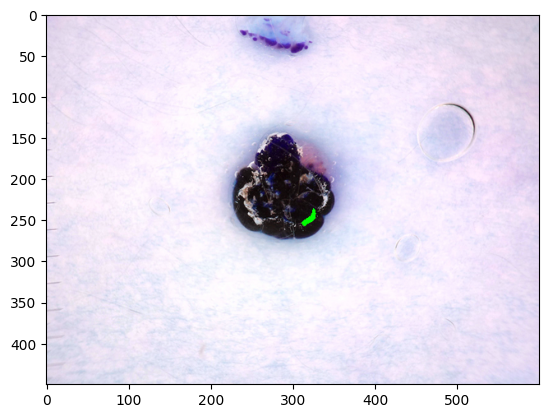

In [ ]:
import cv2
import matplotlib.pyplot as plt

images = ['ISIC_0031197', 'ISIC_0031270', 'ISIC_0029486', 'ISIC_0031901', 'ISIC_0032076', 'ISIC_0025321', 'ISIC_0029404', 'ISIC_0030275', 'ISIC_0026092', 'ISIC_0024904']
img_path = '/images/'+ images[6]+'.jpg'
img = plt.imread(img_path)

# Convert image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray_blurred = cv2.GaussianBlur(gray, (11, 11), 0)

# Detect edges
edged = cv2.Canny(gray_blurred, 30, 60)

# Find contours
contours = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]

# Draw filled contours
image_to_draw = img.copy()

# Sort contours by area and keep the largest one
contours = sorted(contours, key=cv2.contourArea, reverse=True)

# Fill the largest contour (or change this to a loop to fill all contours)
if contours:
    cv2.drawContours(image_to_draw, contours, 0, (0, 255, 0), thickness=-1)  # Use -1 to fill the contour

# Display the result
plt.imshow(cv2.cvtColor(image_to_draw, cv2.COLOR_BGR2RGB))
plt.show()

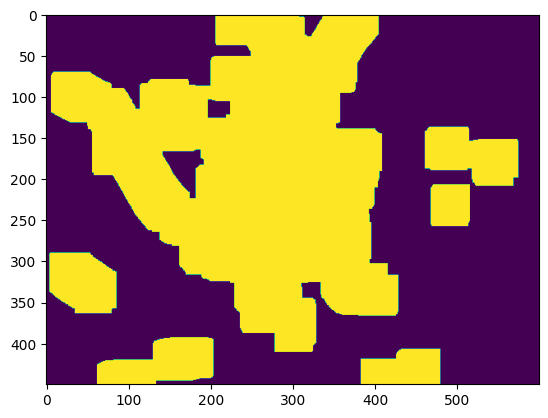

In [ ]:
import cv2
import matplotlib.pyplot as plt

images = ['ISIC_0031197', 'ISIC_0031270', 'ISIC_0029486', 'ISIC_0031901', 'ISIC_0032076', 'ISIC_0025321', 'ISIC_0029404', 'ISIC_0030275', 'ISIC_0026092', 'ISIC_0024904']
img_path = '/images/'+ images[2]+'.jpg'
img = plt.imread(img_path)

# Convert image to grayscale
red = get_image_channels(img, ['r'])
red_blurred = cv2.GaussianBlur(red, (9, 9), 0)

# Detect edges
edged = cv2.Canny(red_blurred, 5, 25)

kernel = np.ones((5, 5), np.uint8)  # You can adjust the size based on how much you want to connect

enclosed_edged = cv2.dilate(edged, kernel, iterations=1)
# Dilate to connect close edges
for i in range(10):
  dilated = cv2.dilate(enclosed_edged, kernel, iterations=2)
  enclosed_edged = cv2.erode(dilated, kernel, iterations=1)


contours = cv2.findContours(enclosed_edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
contours = sorted(contours, key = cv2.contourArea, reverse = True)

image_to_draw = img.copy()

if contours:
    cv2.drawContours(image_to_draw, contours, 0, (0, 255, 0), thickness=-1)

plt.imshow(enclosed_edged)

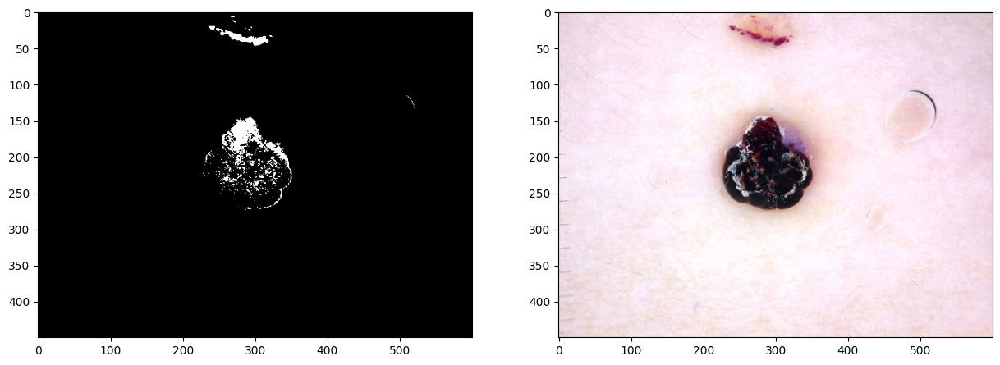

In [ ]:
images = ['ISIC_0031197', 'ISIC_0031270', 'ISIC_0029486', 'ISIC_0031901', 'ISIC_0032076', 'ISIC_0025321', 'ISIC_0029404', 'ISIC_0030275', 'ISIC_0026092', 'ISIC_0024904']
img_path = '/images/'+ images[6]+'.jpg'
img = plt.imread(img_path)

# convert image to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#H - 0:25, S - 0:75, V - 0:255
lower1 = np.array([130, 100, 0])
upper1 = np.array([200, 255, 255])
mask1 = cv2.inRange(hsv, lower1, upper1) #первое облако точек


mask = mask1

fig, axes = plt.subplots(1, 2, figsize = (15, 8))
axes[0].imshow(mask, cmap = 'gray')
axes[1].imshow(img)

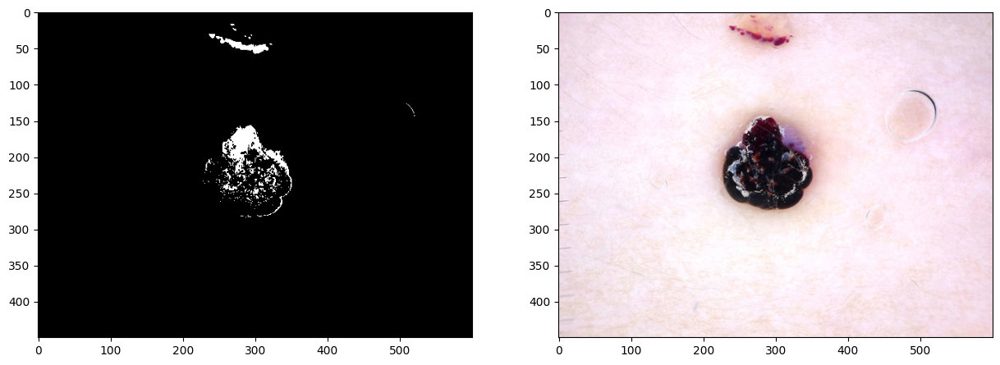

In [ ]:
def binary_erosion(binary_map: np.ndarray, kernel: int) -> np.ndarray:
    """Remove small connected components from a binary image."""
    dilated_map = cv2.dilate(binary_map, kernel = (kernel, kernel))
    eroded_map = cv2.erode(dilated_map, kernel = (kernel, kernel))

    for i in range(10):
        dilated_map = cv2.dilate(eroded_map, kernel = (kernel, kernel))
        eroded_map = cv2.erode(dilated_map, kernel = (kernel, kernel))

    return eroded_map


fig, axes = plt.subplots(1, 2, figsize = (15, 8))
axes[0].imshow(binary_erosion(mask, 100), cmap = 'gray')
axes[1].imshow(img)

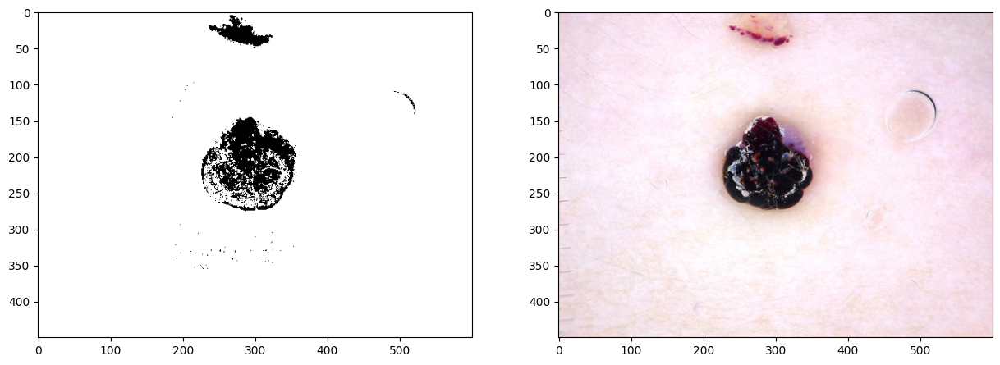

In [ ]:
# convert image to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
#H - 0:25, S - 0:75, V - 0:255
lower1 = np.array([0, 0, 0])
upper1 = np.array([25, 75, 255])
mask1 = cv2.inRange(hsv, lower1, upper1) #первое облако точек

#H - 100:179, S - 0:60, V - 0:255
lower2 = np.array([100, 0, 0])
upper2 = np.array([179, 60, 255])
mask2 = cv2.inRange(hsv, lower2, upper2) #второе облако точек

mask = mask1 + mask2

fig, axes = plt.subplots(1, 2, figsize = (15, 8))
axes[0].imshow(mask, cmap = 'gray')
axes[1].imshow(img)

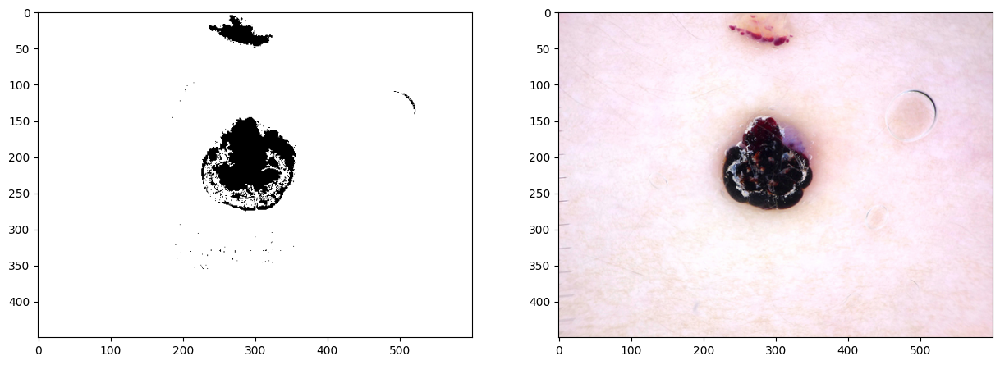

In [ ]:
def find_objects(binary_map: np.ndarray) -> np.ndarray:
    """Remove small connected components from a binary image."""
    n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_map, 8, cv2.CV_32S)

    # get areas of all components except the background (first label)
    areas = stats[1:, cv2.CC_STAT_AREA]

    # сreate a new binary image with only the components whose area is >= 100
    result = np.zeros(labels.shape, np.uint8)
    for i, area in enumerate(areas):
        if area >= 100:
            result[labels == i+1] = 255

    return result


fig, axes = plt.subplots(1, 2, figsize = (15, 8))
axes[0].imshow(find_objects(mask), cmap = 'gray')
axes[1].imshow(img)

К сожалению, достичь нормального качества не удалось. Поэтому откажемся от идеи сегментации и будем работать с обучением без нее.

# Аугментация

Теперь для последующего обучения загрузим все картинки с аугментациями в колаб, и в дальнейшем будем использовать этот файл для обучения модели

Далее написан код только для класса vasc, чтобы не писать тяжелые циклы и следить за тем, что каждый класс картинок загружен

In [ ]:
data = pd.read_csv('HAM10000_metadata.csv')
name = 'vasc'

In [ ]:
group_names, group_images = get_all_grouped_images(data = data, name = name, num_images = -1)

In [ ]:
aug_names_, aug_images_ = augmentation(group_names, group_images, flip_img = True, blur_img = True, angles_for_rotate = [90, 180, 270])

Примеры наших аугментаций:

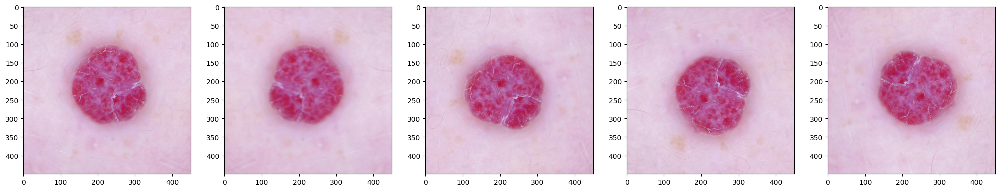

In [ ]:
fig, axes = plt.subplots(1, 5, figsize = (25, 15))
for index in range(5):
  axes[index].imshow(aug_images_[index][0])

In [ ]:
# Платон
import shutil
def download_images(image_names : list[str],
                    image_vectors : list[np.array],
                    target_directory : str):
  if not os.path.exists(target_directory):
    os.mkdir(target_directory)
  for i_image in tqdm(range(len(image_vectors))):
    Image.fromarray(image_vectors[i_image]).save(f'{target_directory}/{image_names[i_image]}.jpg', quality = 100, subsampling = 0) # No compression
  return 1

In [ ]:
# vasc (Flip + Blur + Rotations) Done
# df (Flip + Blur + Rotations) Done
# akiec (Flip + Blur + Rotations) Done
# bcc (Flip + Blur + Rotations) Done
# mel (Flip + Blur + Rotations) Done
# bkl (Flip + Blur + Rotations) Done
# nv (Blur) Done

target_dir = name + '_augmentations_full_res'
if os.path.exists(target_dir):
    shutil.rmtree(target_dir)
for i in range(len(aug_names_)):
  download_images(aug_names_[i], aug_images_[i], name + '_augmentations_full_res')

100%|██████████| 141/141 [00:00<00:00, 195.84it/s]


In [ ]:
!zip -r /content/vasc_augmentations_full_res.zip /content/vasc_augmentations_full_res/

  adding: content/vasc_augmentations_full_res/ (stored 0%)
  adding: content/vasc_augmentations_full_res/ISIC_0027665_vasc_ro270.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0032775_vasc_ro180.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0029439_vasc_ro270.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0026693_vasc_blur.jpg (deflated 3%)
  adding: content/vasc_augmentations_full_res/ISIC_0024375_vasc_flip.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0030275_vasc_ro90.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0027159_vasc_ro270.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0030606_vasc_flip.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0031706_vasc_ro90.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0024867_vasc_ro180.jpg (deflated 1%)
  adding: content/vasc_augmentations_full_res/ISIC_0028714_vasc_bl